# Appendix Figures and Tables

In [1]:
import os
import numpy as np
import numpy.ma as ma
import pandas as pd
import iris
import matplotlib.pyplot as plt
os.environ["PROJ_LIB"] = "C:\\Utilities\\Python\\Anaconda\\Library\\share"; #fixr
from mpl_toolkits.basemap import Basemap
from mpl_toolkits.axes_grid1 import make_axes_locatable
from textwrap import wrap
from src.ploter_functions import difference_to_pair_plot 
from src.ploter_functions import elevation_difference_to_ensemble_plot 
from src.ploter_functions import correlation_bias_elevation_pair_plot 
from src.ploter_functions import stl_example_plot 

In [2]:
results_figures_path = '/home/users/carter10/Antarctica_Climate_Variability/results/Paper_Figures/'

## Figure A1

In [3]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'

In [4]:
labels_fontsize = 6
marks_fontsize = 4
ylabel_pad = -0.04
title_height = .95
label_height = .92
label_left = .02
year_min = 2000
year_max = 2010
year_tick_freq = 2
linewidth = .5

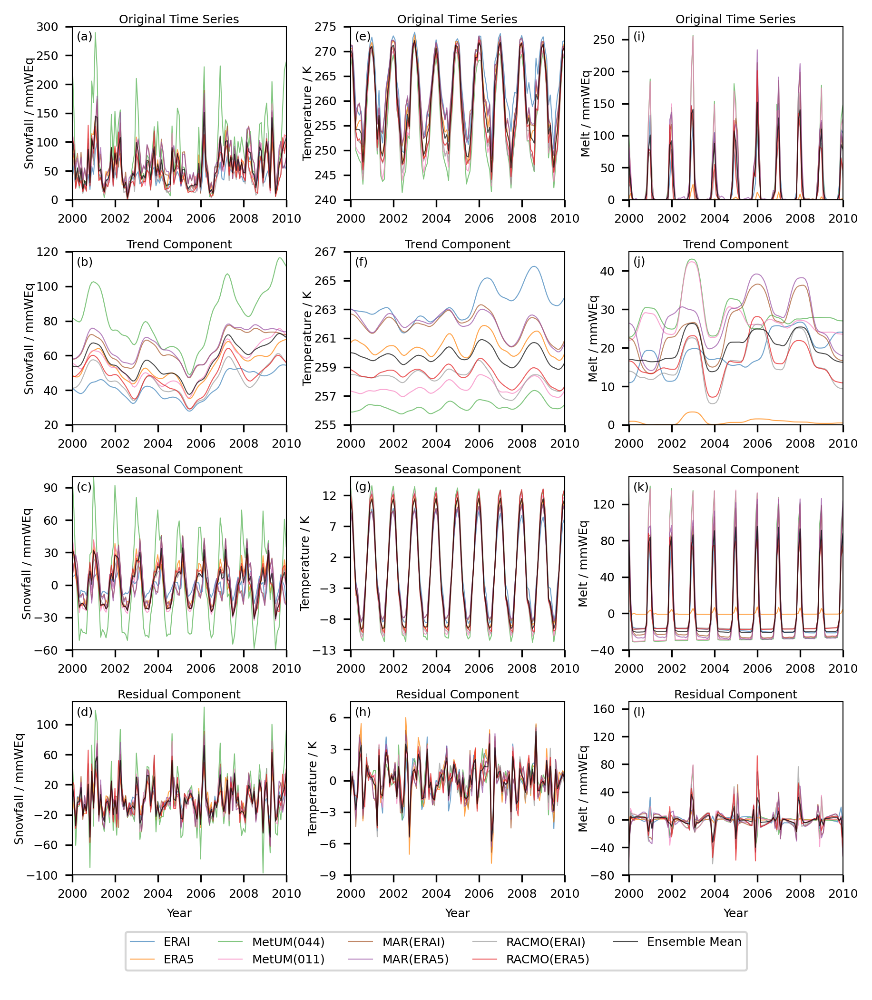

In [5]:
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(figsize=(17.7*cm,20*cm), dpi= 300, facecolor='w', edgecolor='k')
stl_example_plot(input_path,labels_fontsize,ylabel_pad,linewidth,year_min,year_max,year_tick_freq,title_height)
fig.subplots_adjust(hspace=0.3, wspace=0.3)

labels = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)']
axes = plt.gcf().get_axes()
for axis,label in zip(axes,labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_left,label_height),xycoords='axes fraction',fontsize=6) # Setting labels

ensemble_names = ['ERAI','ERA5','MetUM(044)','MetUM(011)','MAR(ERAI)','MAR(ERA5)','RACMO(ERAI)','RACMO(ERA5)']
fig.legend(ensemble_names+['Ensemble Mean'], loc='lower center',ncol=5,fontsize=labels_fontsize,borderaxespad=2.5)
    
fig.savefig(f'{results_figures_path}figa1.png',dpi=300,bbox_inches='tight')

## Figures B1,B2,B3

In [6]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
variables = ['snowfall','temperature','melt']
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')
grid_cube = iris.load(grid_cube_path)[0][0]

In [7]:
models = [1,3,5,7] #[0:ERAI,1:ERA5,2:MetUM(044),3:MetUM(011),4:MAR(ERAI),5:MAR(ERA5),6:RACMO(ERAI),7:RACMO(ERA5)]
vmin=-3
vmax=3
label_xy = [.01,.02]
title_height = 0.96
row_xy = [-0.05,0.5]
col_titles = ['Mean','Seasonal Standard Deviation','Residual Standard Deviation']
row_titles = ['ERAI-ERA5','MetUM(044)-MetUM(011)','MAR(ERAI)-MAR(ERA5)', 'RACMO(ERAI)-RACMO(ERA5)']
labels = ['(a)','(b)','(c)','(d)','(e)','(f)','(g)','(h)','(i)','(j)','(k)','(l)']
subplot_dimensions = [4,3] # 4 rows, 3 columns of plots

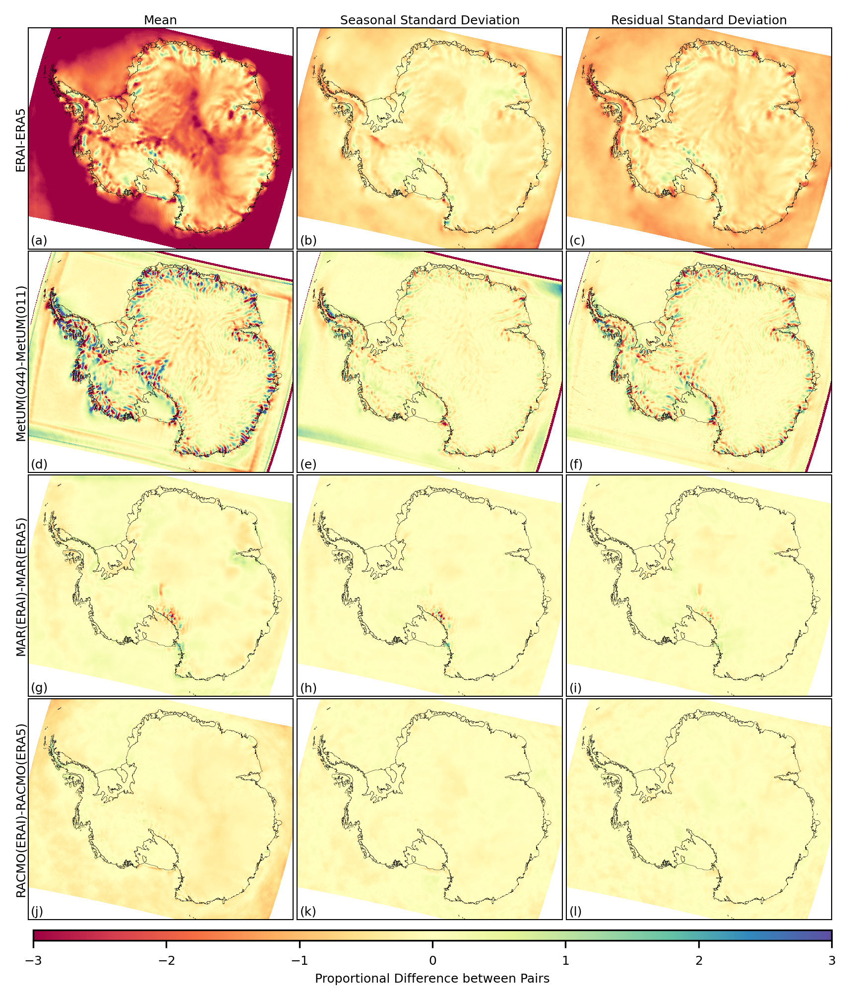

In [8]:
variable = variables[0] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

model_pairs = [0,1]
row_number=0
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [2,3]
row_number=1
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [4,5]
row_number=2
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [6,7]
row_number=3
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Proportional Difference between Pairs', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}figb1.png',dpi=300,bbox_inches='tight')

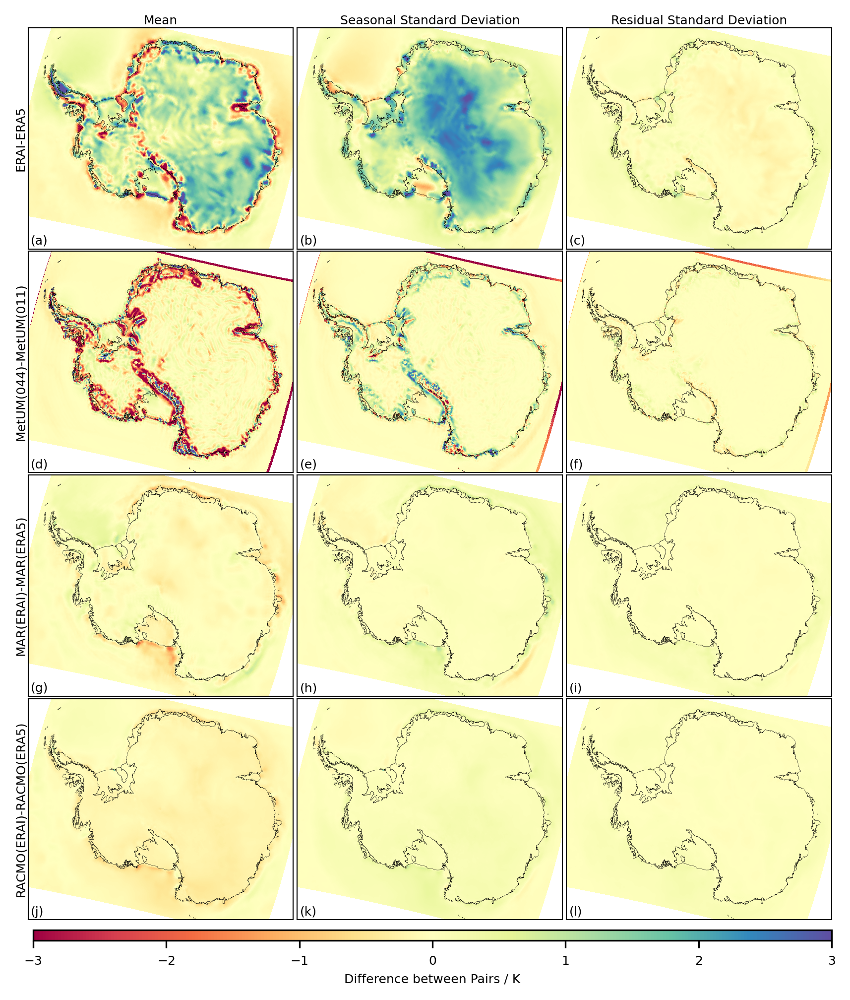

In [9]:
variable = variables[1] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

model_pairs = [0,1]
row_number=0
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [2,3]
row_number=1
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [4,5]
row_number=2
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [6,7]
row_number=3
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Difference between Pairs / K', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}figb2.png',dpi=300,bbox_inches='tight')

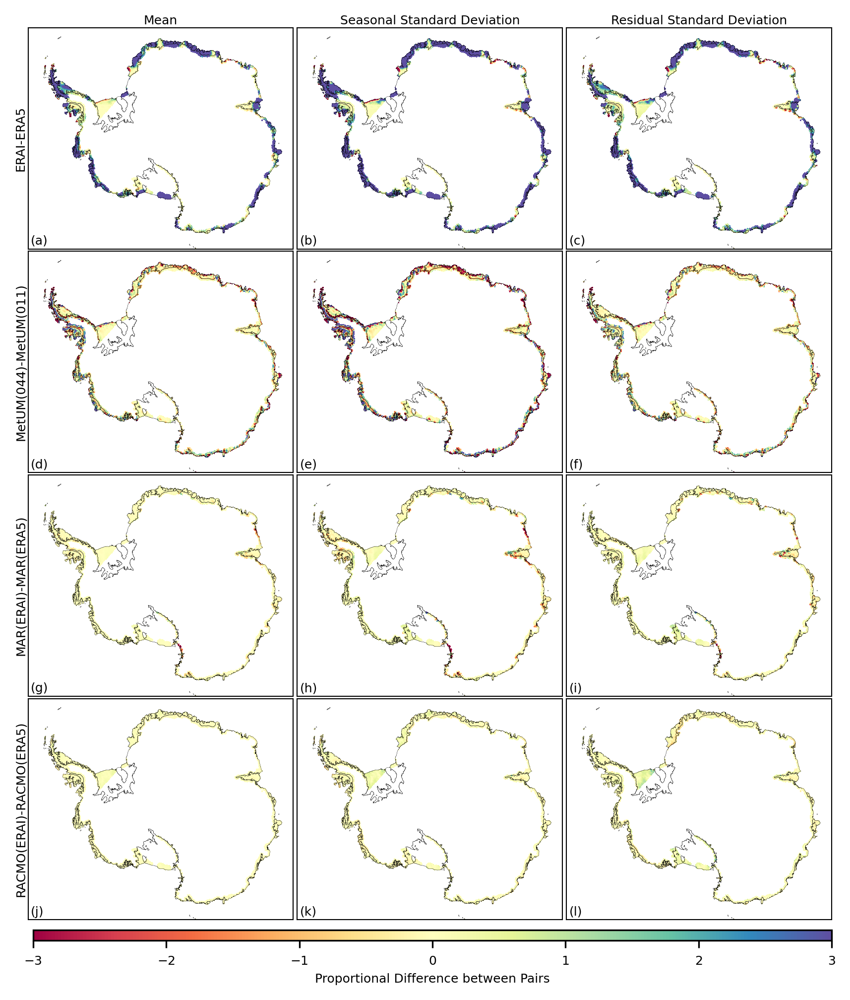

In [10]:
variable = variables[2] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(4, 3, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,17.7*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

model_pairs = [0,1]
row_number=0
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [2,3]
row_number=1
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [4,5]
row_number=2
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)
model_pairs = [6,7]
row_number=3
difference_to_pair_plot(input_path,antarctica_map,vmin,vmax,variable,model_pairs,grid_cube,land_only_mask,mean_melt,row_number,subplot_dimensions)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Proportional Difference between Pairs', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels
for axis,coltitle in zip(plt.gcf().get_axes(),col_titles):
    axis.set_title(coltitle,loc='center',y=title_height,fontsize=6) # Setting column titles
for axis,rowtitle in zip(plt.gcf().get_axes()[::3],row_titles):
    axis.annotate(rowtitle,xy=(row_xy[0],row_xy[1]),xycoords='axes fraction',fontsize=6,rotation=90,va='center') # Setting row titles
    
fig.savefig(f'{results_figures_path}figb3.png',dpi=300,bbox_inches='tight')

## Figure C1

In [11]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
grid_cube_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Postprocessed_Data/MetUM_011_ERA_INT_tas_2000.nc'
grid_cube = iris.load(grid_cube_path)[0][0]

In [12]:
vmin=-100
vmax=100
label_xy = [.01,.02]
title_height = 0.96
row_xy = [-0.05,0.5]
labels = ['(a) ERAI','(b) ERA5','(c) MetUM(044)','(d) MetUM(011)','(e) MAR','(f) RACMO']

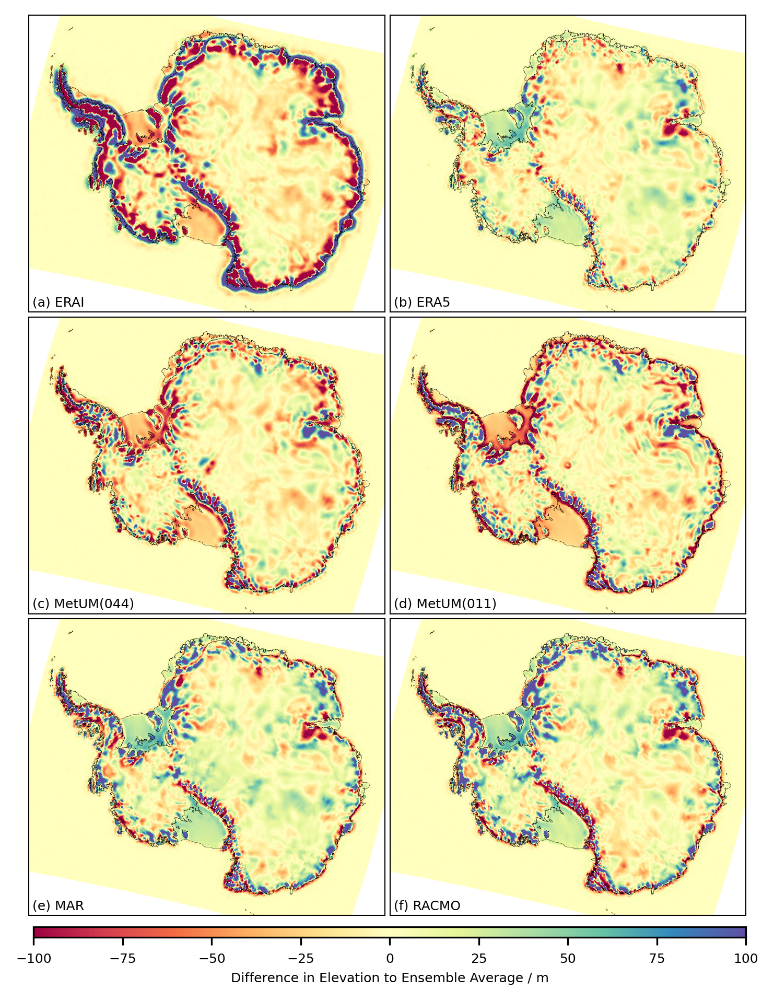

In [13]:
antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(3, 2, sharex='col',dpi= 300, sharey='row',figsize=(15*cm,17.0*cm))
fig.subplots_adjust(hspace=0.01, wspace=0.015)

elevation_difference_to_ensemble_plot(input_path,antarctica_map,vmin,vmax,grid_cube)

fig.subplots_adjust(bottom=0.02)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)

colorbar_label = "\n".join(wrap('Difference in Elevation to Ensemble Average / m', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label in zip(plt.gcf().get_axes(),labels):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    axis.annotate(label,xy=(label_xy[0],label_xy[1]),xycoords='axes fraction',fontsize=6) # Setting labels

fig.savefig(f'{results_figures_path}figc1.png',dpi=300,bbox_inches='tight')

## Figure C2

In [14]:
input_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Ensemble_Array_Data/'
mask_path = '/home/users/carter10/Shared_Storage/Antarctica_Climate_Variability/Mask_Data/'
variables = ['snowfall','temperature','melt']
land_only_mask = np.load(f'{mask_path}metum011_grid_land_filter.npy')
mean_melt = np.load(f'{input_path}mean_melt.npy')

In [15]:
label_xy = [.02,.02]
correlation_label_xy = [.62,.93]
labels = ['(a) ERAI-ERA5','(b) MetUM(044)-MetUM(011)','(c) MetUM(011)-MAR(ERA5)','(d) MetUM(011)-RACMO(ERA5)']
subplot_dimensions = [2,2] # 2 rows, 2 columns of plots
model_pairs_list = [[0,1],[2,3],[3,5],[3,7]]
plt_number_list = [1,2,3,4]
xlims_list = [[-100,100],[-20,20],[-100,100],[-100,100]]
ylims_list = [[0,2],[-0.5,0.5],[-3,1],[-1,3]]

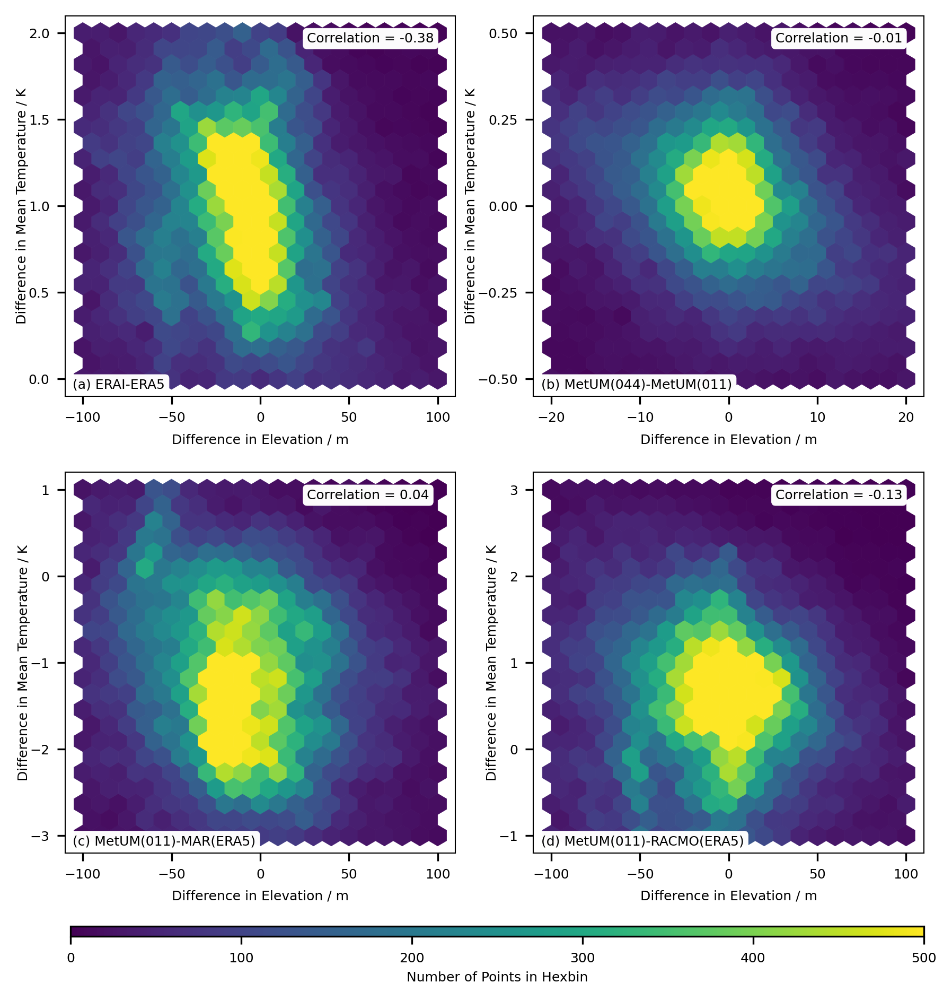

In [16]:
plt.rcParams.update({'font.size': 6})

variable = variables[1] 

antarctica_map = Basemap(width=6000000,height=5000000,projection='laea',lat_ts=-55,lat_0=-90,lon_0=0,resolution='l')
cm = 1/2.54  # centimeters in inches
fig, ax = plt.subplots(2, 2, sharex='col',dpi= 300, sharey='row',figsize=(17.7*cm,16.7*cm))
fig.subplots_adjust(hspace=0.2, wspace=0.2)

plots,correlations = [],[]
for model_pairs,plt_number,xlims,ylims in zip(model_pairs_list,plt_number_list,xlims_list,ylims_list):
    plot,correlation = correlation_bias_elevation_pair_plot(input_path,antarctica_map,xlims,ylims,variable,model_pairs,land_only_mask,mean_melt,subplot_dimensions,plt_number)
    plots.append(plot)
    correlations.append(correlation)
    
axes = plt.gcf().get_axes()

fig.subplots_adjust(bottom=0.08)
cax = fig.add_axes([0.13, 0.0, 0.77, 0.01]) #left,bottom,width,height
cbar = plt.colorbar(cax=cax,orientation="horizontal")
cbar.ax.tick_params(labelsize=6)
colorbar_label = "\n".join(wrap('Number of Points in Hexbin', 100))
cbar.set_label(colorbar_label,labelpad=3,fontsize=6)

for axis,label,correlation in zip(plt.gcf().get_axes(),labels,correlations):
    [x.set_linewidth(0.5) for x in axis.spines.values()] #Setting border line width
    bbox_props = dict(boxstyle="round", fc="w", ec="w",lw=0.2, alpha=0.99)
    axis.text(label_xy[0],label_xy[1],label,transform=axis.transAxes, size=6,bbox=bbox_props)
    axis.text(correlation_label_xy[0],correlation_label_xy[1],f'Correlation = {round(correlation,2)}',transform=axis.transAxes, fontsize=6,bbox=bbox_props)

plt.rcParams.update({'font.size': plt.rcParamsDefault['font.size']})
fig.savefig(f'{results_figures_path}figc2.png',dpi=300,bbox_inches='tight')